# EDA

In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn.linear_model as linear_model
import plotly.graph_objects as go
from math import ceil
import calendar
import plotly.express as px
from scipy.special import boxcox, inv_boxcox
from plotly.offline import init_notebook_mode, iplot
from datetime import timedelta

In [81]:
#!pip install nest_asyncio
import nest_asyncio
nest_asyncio.apply()

In [82]:
df = pd.read_csv('SeoulBikeData.csv', encoding= 'unicode_escape')

In [83]:
df['Date'] = pd.to_datetime(df['Date'])

In [84]:
df = df.rename(columns={'Rented Bike Count': 'RBC', 'Temperature(°C)': 'Temp',
                   'Humidity(%)': 'Humidity', 'Wind speed (m/s)': 'Windspeed', 
                   'Visibility (10m)': 'Visibility', 'Dew point temperature(°C)': 'Dew Point',
                   'Solar Radiation (MJ/m2)' : 'Solar Radiation', 
                   'Rainfall(mm)' : 'Rainfall', 'Snowfall (cm)': 'Snowfall'
                  })

When we observe the data we realize that Hour column is a numerical column but it is a time stamp so we have to treat Hour as a categorical feature


In [85]:
df['Hour'] = df['Hour'].astype('object')

# Generate 'business hour' feature

A very useful feature that we will generate, has to do with the business hours, i.e. whether businesses are open or not in a given hour. The most usual business hours are from Monday-Saturday, from 9:00AM-17:30PM.

Therefore, the value of the 'business hour' will be equal to '1' if the given hour is within the business hours, and equal to '0' for all other given hours.

In [86]:
for i in range(len(df)):
    position = df.Date[i]
    hour = df.at[i, 'Hour']
    df.at[i, 'Hour_new']= timedelta(hours=int(hour)) 
    
    if (position.day_name() != "Sunday" and hour >= 9 and hour < 18):
        df.loc[i, 'business hour'] = 1
    else:
        df.loc[i, 'business hour'] = 0

df["business hour"] = df["business hour"].astype(int)

In [87]:
df['Date_new'] = df.Date + df.Hour_new

In [88]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

numeric_features= df.select_dtypes(include=numerics)

In [89]:
def add_time_features(df):
    cet_index = df.Date
    df["month"] = cet_index.dt.month #month_name()
    df["is_weekend"] = ((pd.DatetimeIndex(df.Date).dayofweek) // 5 == 1).astype(int)
    df["weekday"] = cet_index.dt.dayofweek #day_name()
    #df["week"]= cet_index.dt.week
    df["year"] = cet_index.dt.year
    df["weekday_name"] = cet_index.dt.day_name()
    return df

In [90]:
df = add_time_features(df)

In [91]:
print('There are {} missing values or NaNs in the dataset.'
      .format(df.isnull().values.sum()))

nr_duplicate = df.index.duplicated().sum()

print('There are {} duplicate rows in the dataset based on all columns.'
      .format(nr_duplicate))

There are 0 missing values or NaNs in the dataset.
There are 0 duplicate rows in the dataset based on all columns.


In [92]:
print('The DataFrame contains {} lines and {} columns'.format(df.shape[0],df.shape[1]))
print('Days = ', int(8760/24))

The DataFrame contains 8760 lines and 22 columns
Days =  365


In [93]:
df.groupby(['Functioning Day']).agg({'RBC': ['mean', 'std', 'count']}).reset_index()

Functioning Day         RBC                  
                         mean         std count
0              No    0.000000    0.000000   295
1             Yes  729.156999  642.351166  8465

We can see that the number of rented bike is 0 for hours when this is a non functionning day. So I remove these samples from the dataset.

In [94]:
N = len(df)
print(f'Dataset before non-functionning days deletion: {len(df)}')
print(f'Number of non-functionning days: ', len(df['Functioning Day'] != 1))
df = df[df['Functioning Day'] == "Yes"].drop('Functioning Day', axis=1)
print(f'Dataset  after non-functionning days deletion: {len(df)}')

Dataset before non-functionning days deletion: 8760
Number of non-functionning days:  8760
Dataset  after non-functionning days deletion: 8465


As can be seen in the correlation notebook, the Visibility is by default at 2000 which is weird to interpret as a maximum visibility. So I decide to change the visibility feature to Inverse_Visibility which reverts the distribution. It will be interpreted as the removed (reduced) visibility (10m)

In [95]:
df['Inverse_Visibility'] = df.Visibility.max() - df.Visibility
df = df.drop('Visibility', axis=1)

Yet looking more precisely, we see it is more a categorical variable. If there are 1 or 10 mm of snow, the number of bike rented seems to follow the same distribution. In other words, snow is like disqualifying. So I choose to transform this variable into a boolean one and see the results on a notch box plot

In [96]:
df['Snowing'] = (df.Snowfall > 0).astype(np.int)
df = df.drop('Snowfall', axis=1)

Windspeed has a right skewed distribution. So I will apply a log-transform on this feature.

In [97]:
df['Windspeed'] = np.log(df['Windspeed'] + 1)

In [98]:
df['Dryness'] = 1 / (df.Rainfall + 1)
df = df.drop('Rainfall', axis=1)

# Missing dates

In [20]:
idx = pd.date_range('2017-01-12', '2018-12-11 ')

In [21]:
print("Missing days in dataset:", len(pd.date_range(start="2017-01-12", end="2018-12-11").difference(df.Date)))

Missing days in dataset: 346


# Outlier

In [22]:
numeric_features= df.select_dtypes(include=numerics)

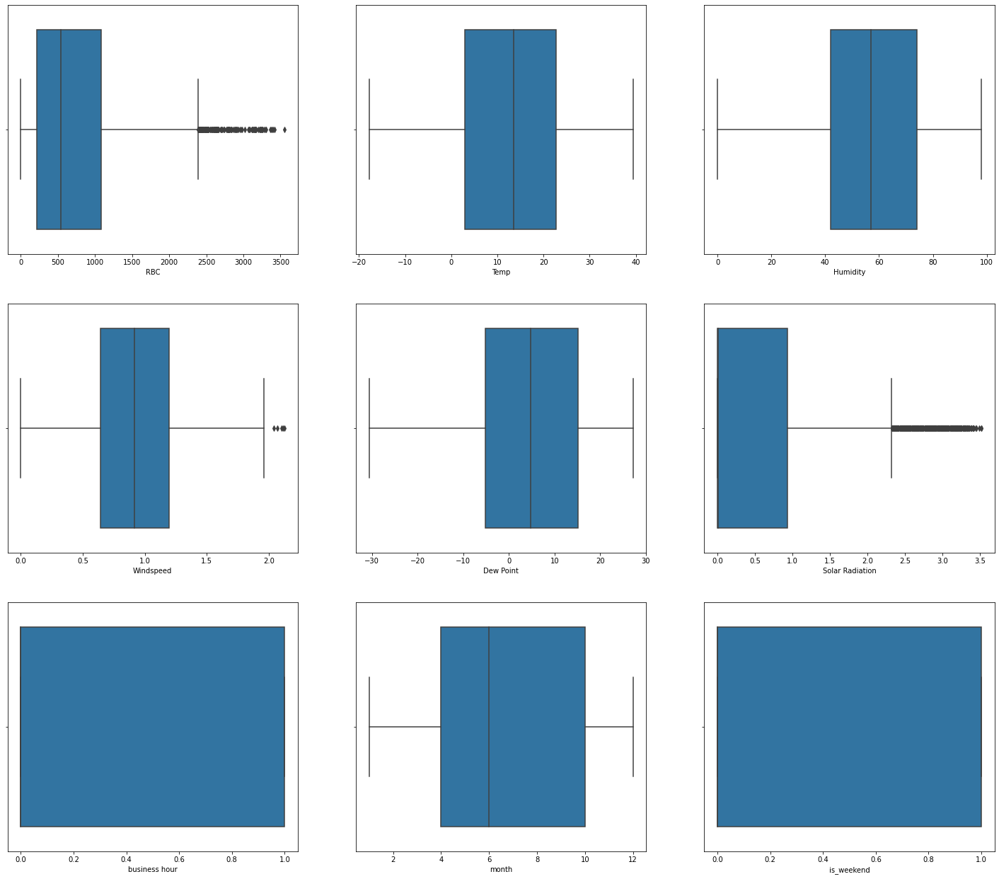

In [23]:
fig, ax = plt.subplots(figsize=(25,22)) 
for i in range(1, 10):
    plt.subplot(3, 3, i) 
    sns.boxplot(x=df[numeric_features.columns[i-1]])

plt.show()

Our target variable, count is not normally distributed.
Our target variable is right-skewed.
There are multiple outliers in the variable. We cannot think of any strong evidence to get rid of outlier data. As per Chebychev's rule, 3 std. deviations account for 99% of data. Using this approach, we filter out the rest of the data.

In [24]:
#Calculating the number of outliers
Q1 = df['RBC'].quantile(0.25)
Q3 = df['RBC'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['RBC'] < (Q1 - 1.5 * IQR)) | (df['RBC'] > (Q3 + 1.5 * IQR))]
print((len(outliers)/len(df))*100)

1.795629060838748


In [25]:
df.shape

(8465, 21)

In [26]:
#Data without the outliers in count
df = df[~df.isin(outliers)]
df = df[df['Date_new'].notnull()]

In [27]:
df.shape

(8313, 21)

# save as preprocessed file

In [28]:
df.to_csv('SeoulBikeData_prep.csv')

# EDA - dynamic 

In [29]:
df_index = df.set_index(df.Date_new)

In [30]:
price_daily = df_index.resample('h')
daily_mean = price_daily.mean()

fig = px.line(daily_mean, x=daily_mean.index, y='RBC', title='Daily average price over time')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=7, label="7d", step="day", stepmode="backward"),
            dict(count=14, label="14d", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

we can observe lots of missing data

Average daily electricity price change by year

In [31]:
df_pivot = pd.pivot_table(df, index=df.Hour, columns=df.month, values='RBC')
df_pivot.columns = ['januar', 'februar', 'märz', 'april','mai','juni','juli','august','september',
                   'oktober', 'november', 'dezember']    

fig = px.line(df_pivot, x=df_pivot.index, y=df_pivot.columns,
              title='Average daily electricity price by month')
fig.update_xaxes(
    dtick="M1")
fig.show()

Average daily electricity price change by year

In [32]:
df_pivot = pd.pivot_table(df, index=df.Hour, columns=df.weekday, values='RBC')
df_pivot.columns = ['montag', 'dienstag', 'mittwoch', 'donnerstag','freitag','samstag','sonntag']    

fig = px.line(df_pivot, x=df_pivot.index, y=df_pivot.columns,
              title='Average daily electricity price by dayofweek')
fig.update_xaxes(
    dtick="M1")
fig.show()

In [33]:
# Define a function to plot different types of time-series

def plot_series(df=None, column=None, series=pd.Series([]), label=None, ylabel=None, title=None, start=0, end=None):
    """
    Plots a certain time-series which has either been loaded in a dataframe and which
    constitutes one of its columns or it a custom pandas series created by the user.
    The user can define either the 'df' and the 'column' or the 'series' and additionally,
    can also define the 'label', the 'ylabel', the 'title', the 'start' and the 'end' of the plot.
    """
    sns.set()
    fig, ax = plt.subplots(figsize=(30, 12))
    ax.set_xlabel('Time', fontsize=16)
    if column:
        ax.plot(df[column][start:end], label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if series.any():
        ax.plot(series, label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if label:
        ax.legend(fontsize=16)
    if title:
        ax.set_title(title, fontsize=24)
    ax.grid(True)
    return ax

<ipython-input-33-9e22b2e85a5b>:3: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



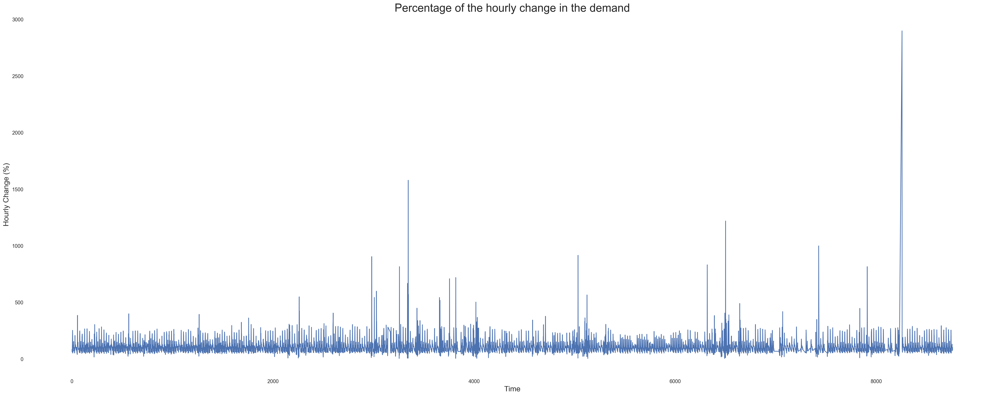

In [154]:
change = df['RBC'].div(df['RBC'].shift(1)).mul(100)
ax = plot_series(series=change, ylabel='Hourly Change (%)', 
                 title='Percentage of the hourly change in the demand')
ax.set_facecolor('white') 
ax.figure.tight_layout()

plt.show()

here we can see that we have demand peaks which can be explained by the missing dates. FUTURE WORK!

# Rented Bike Count

/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Square root')

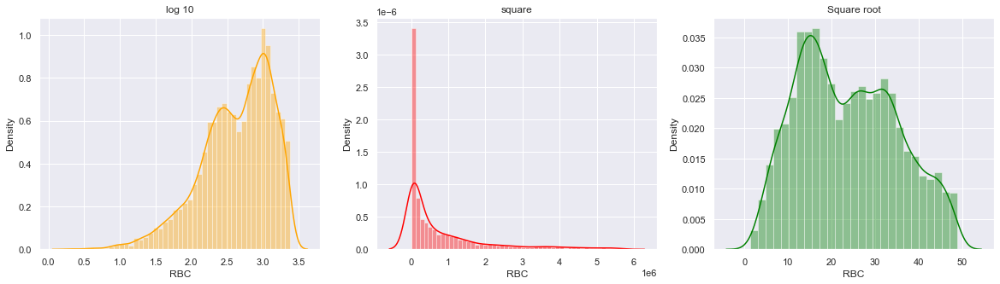

In [35]:
fig,axes = plt.subplots(1,3,figsize=(20,5))
sns.distplot(np.log10(df['RBC']+0.0000001),ax=axes[0],color='orange').set_title("log 10")
sns.distplot((df['RBC']**2),ax=axes[1],color='red').set_title("square")
sns.distplot(np.sqrt(df['RBC']),ax=axes[2], color='green').set_title("Square root")

Square Root

The square root method is typically used when your data is moderately skewed. Now using the square root is a transformation that has a moderate effect on distribution shape. It is generally used to reduce right skewed data. Finally, the square root can be applied on zero values and is most commonly used on counted data.

Logarithmic

The logarithmic is a strong transformation that has a major effect on distribution shape. This technique is, as the square root method, oftenly used for reducing right skewness. However, is that it can not be applied to zero or negative values.

Here we can see the distribution is right skewed. A square root or log transformation is needed to standize this distribution. I will choose a square root transformation because don't want a high effect because of the values from approximatively 500 to 1200. We see on this range 2 gaussian-like subdistribution.



We can conclude a sqrt is most suitable for the n_bike distribution to have a more gaussian-like distribution. 

In [100]:
df['RBC_sqrt'] = np.sqrt(df.RBC)

# Month

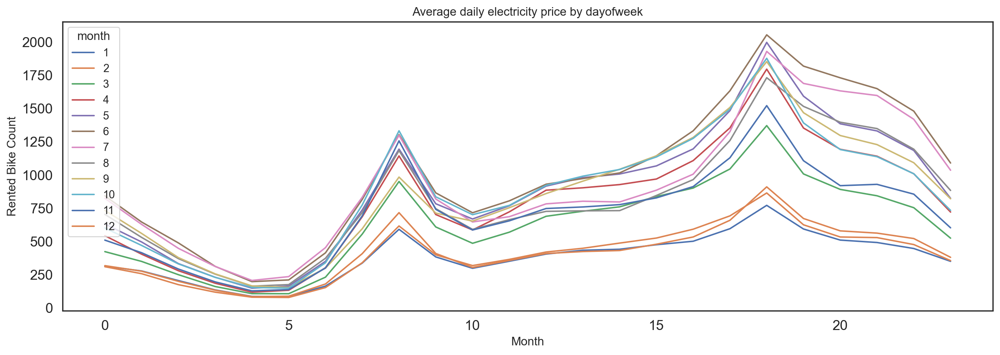

In [101]:
sns.set_style('white')

df_pivot = pd.pivot_table(df, index=df.Hour, columns=df.month, values='RBC')

ax = df_pivot.plot(title='Data by Year', figsize=(14,5))
ax.set_ylabel('Rented Bike Count', fontsize=12)
ax.set_xlabel('Month', fontsize=12)

ax.set_title('Average daily electricity price by dayofweek', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=14)

ax.figure.tight_layout()
plt.savefig('./img/Month_demand.jpg', dpi=300)

plt.show()

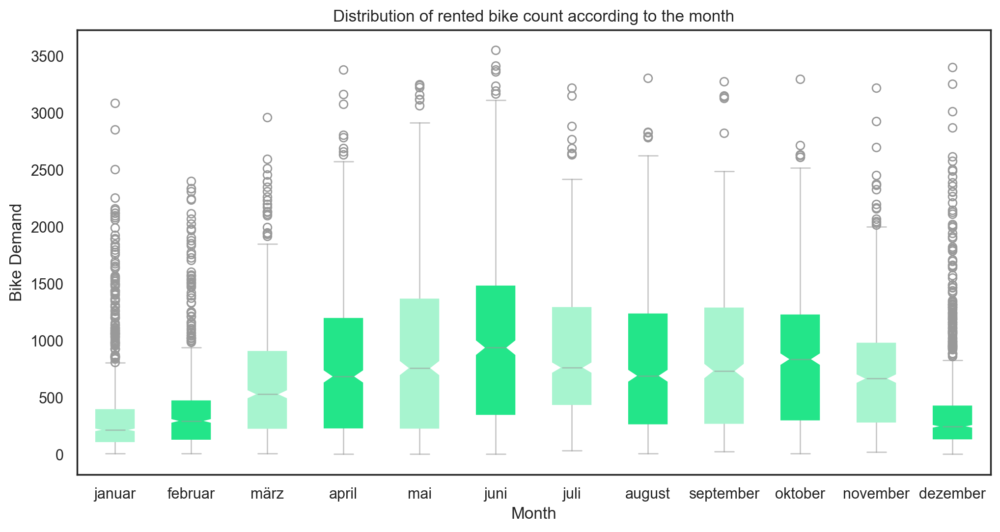

In [163]:
plt.figure(figsize=(12,6))

# group by month to get box plot
groups = df.groupby(by='month', sort=False).RBC
#labels = groups.count().reset_index(name='count').month.values
labels = ['januar', 'februar', 'märz', 'april','mai','juni','juli','august','september',
                  'oktober', 'november', 'dezember']
groups = [groups.get_group(k) for k in groups.groups]

# custom colors
gray_dict = dict(color='#99999988', markeredgecolor='#999999')
colors = ['#A7F4CF', '#23e589']
boxplot = plt.boxplot(
    groups, notch=True, vert=True, patch_artist=True, labels=labels,
    capprops=gray_dict, whiskerprops=gray_dict, flierprops=gray_dict, medianprops=gray_dict
)
# change box colors
for i, patch in enumerate(boxplot['boxes']):
    patch.set_color(colors[i%len(colors)])

plt.title('Distribution of rented bike count according to the month')
plt.xlabel('Month')
plt.ylabel('Bike Demand')
plt.savefig('./img/Month_distribution.jpg', dpi=300)

# display multiple aggregates and remove the temporary columns
#df.groupby('month', sort=False).agg({'RBC': ['count', 'sum', 'mean', 'min', 'max', 'median', 'std']}).apply(lambda row: [f'{x:.1f}' for x in row])


Here we clearly see monthes has an impact on the number of bikes rented. Moreover we can suppose the season will be a good resume of this plot. Indeed we see for the winter monthes less bikes rented and inversely.

# Weekday

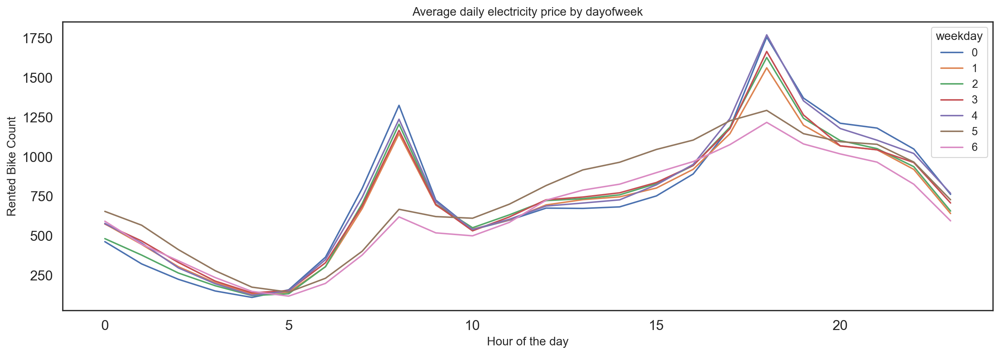

In [103]:
sns.set_style('white')

df_pivot = pd.pivot_table(df, index=df.Hour, columns=df.weekday, values='RBC')

ax = df_pivot.plot(title='Data by Year', figsize=(14,5))
ax.set_ylabel('Rented Bike Count', fontsize=12)
ax.set_xlabel('Hour of the day', fontsize=12)

ax.set_title('Average daily electricity price by dayofweek', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=14)

ax.figure.tight_layout()
plt.savefig('./img/Weekday_demand.jpg', dpi=300)

plt.show()

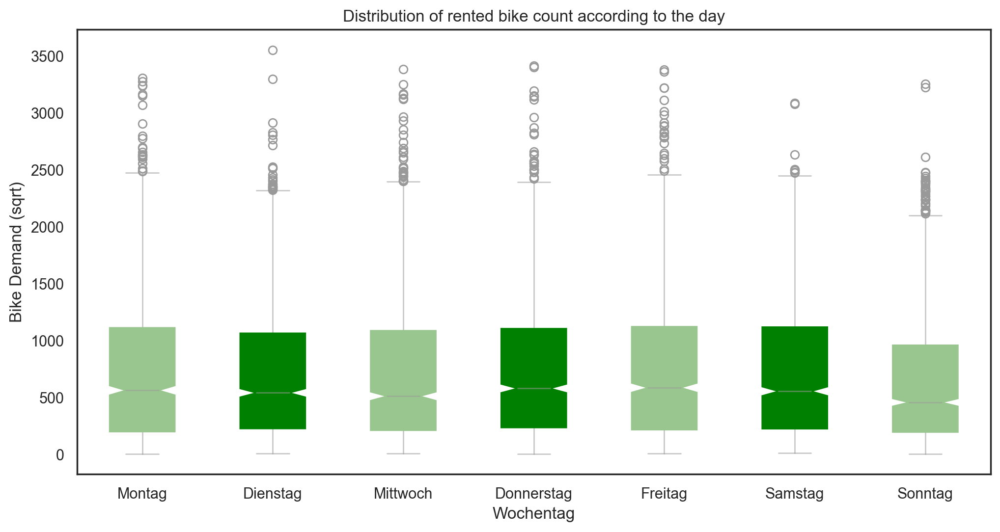

In [146]:
plt.figure(figsize=(12,6))

# group by month to get box plot
groups = df.groupby(by='weekday').RBC
labels = groups.count().reset_index(name='count').weekday.values
labels = ['Montag', 'Dienstag', 'Mittwoch', 'Donnerstag','Freitag','Samstag','Sonntag']
groups = [groups.get_group(k) for k in groups.groups]

# custom colors
gray_dict = dict(color='#99999988', markeredgecolor='#999999')
colors = ['#A7F4CF', '#23e589']
boxplot = plt.boxplot(
    groups, notch=True, vert=True, patch_artist=True, labels=labels,
    capprops=gray_dict, whiskerprops=gray_dict, flierprops=gray_dict, medianprops=gray_dict
)
# change box colors
for i, patch in enumerate(boxplot['boxes']):
    patch.set_color(colors[i%len(colors)])

plt.title('Distribution of rented bike count according to the day')
plt.xlabel('Wochentag')
plt.ylabel('Bike Demand (sqrt)')
plt.savefig('./img/Weekday_distribution.jpg', dpi=300)

# display multiple aggregates and remove the temporary columns
#df.groupby('month', sort=False).agg({'RBC': ['count', 'sum', 'mean', 'min', 'max', 'median', 'std']}).apply(lambda row: [f'{x:.1f}' for x in row])


In [67]:
#########################
## Business Question 1 ##
#########################
# Is there a day of the week when bikes are rented more than others?

# Mean of bikes rented sorted by day 
df.groupby('weekday')['RBC'].mean()

weekday
0.0    23.801869
1.0    23.871739
2.0    23.423766
3.0    24.068824
4.0    24.208571
5.0    24.304801
6.0    22.616876
Name: RBC, dtype: float64

In [68]:
# Sum of bikes rented sorted by day 
df.groupby('weekday')['RBC'].sum()

weekday
0.0    26777.102321
1.0    28311.882545
2.0    28506.723385
3.0    29436.172096
4.0    27815.648188
5.0    29360.199689
6.0    27253.335809
Name: RBC, dtype: float64

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



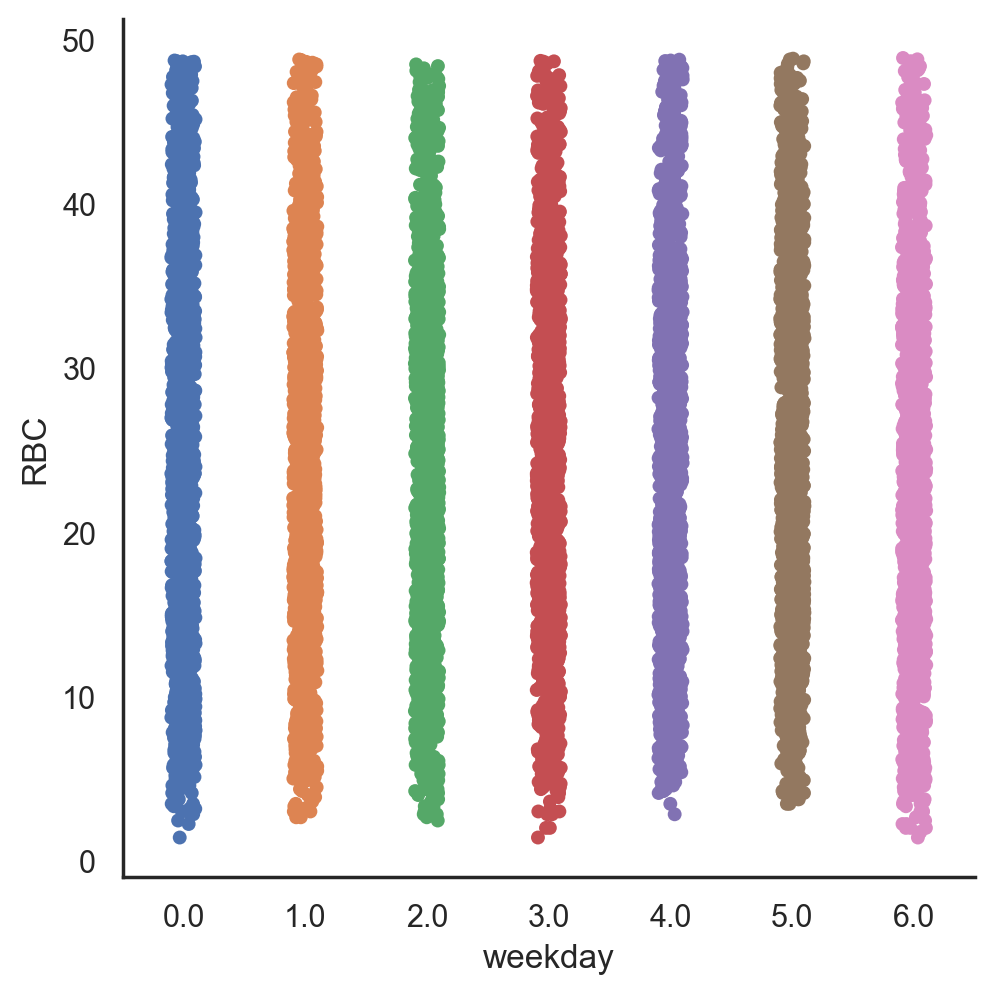

In [70]:
# Scatter plot of rented bikes by day or week 
sns.catplot('weekday','RBC', data=df)

# Weekend

In [47]:
plt.rcParams['figure.figsize'] = [12, 4] # default = [6.0, 4.0]
plt.rcParams['figure.dpi']     = 200     # default = 72.0
plt.rcParams['font.size']      = 7.5     # default = 10.0

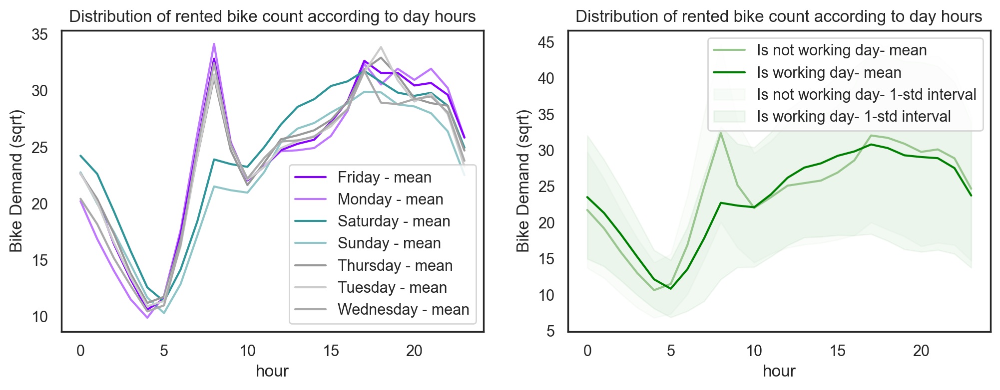

In [49]:

fig, axes = plt.subplots(1, 2)
# Weekdays plot
_temp = df.groupby(['weekday_name', 'Hour']).agg({'RBC': ['mean', 'std']}).reset_index()
colors = ['#80f', '#80f8', '#2f9599', '#2f959988', '#999', '#ccc', '#aaa']
for weekday_name, color in zip(_temp.weekday_name.unique(), colors):
    mean = _temp.RBC[_temp.weekday_name == weekday_name]['mean']
    axes[0].plot(_temp[_temp.weekday_name == weekday_name].Hour, mean, color=color, label=f'{weekday_name} - mean') 
axes[0].legend()
axes[0].set_title('Distribution of rented bike count according to day hours')
axes[0].set_xlabel('hour')
axes[0].set_ylabel('Bike Demand (sqrt)')

# working days plot
_temp = df.groupby(['is_weekend', 'Hour']).agg({'RBC': ['mean', 'std']}).reset_index()
colors = ['#A7F4CF', '#23e589']
for is_weekend, color in zip(_temp.is_weekend.unique(), colors):
    mean = _temp.RBC[_temp.is_weekend == is_weekend]['mean']
    std = _temp.RBC[_temp.is_weekend == is_weekend]['std']
    axes[1].plot(_temp[_temp.is_weekend == is_weekend].Hour, mean, color=color, label=f'{"Is" if is_weekend else "Is not"} working day- mean') 
    axes[1].fill_between(_temp[_temp.is_weekend == is_weekend].Hour, mean - std, mean + std, color=color, alpha=0.05, label=f'{"Is" if is_weekend else "Is not"} working day- 1-std interval') 
axes[1].legend()
axes[1].set_title('Distribution of rented bike count according to day hours')
axes[1].set_xlabel('hour')
axes[1].set_ylabel('Bike Demand (sqrt)')
plt.savefig('./img/weekday_workingday_subplot.jpg', dpi=300)

pass

<Figure size 2400x1200 with 0 Axes>

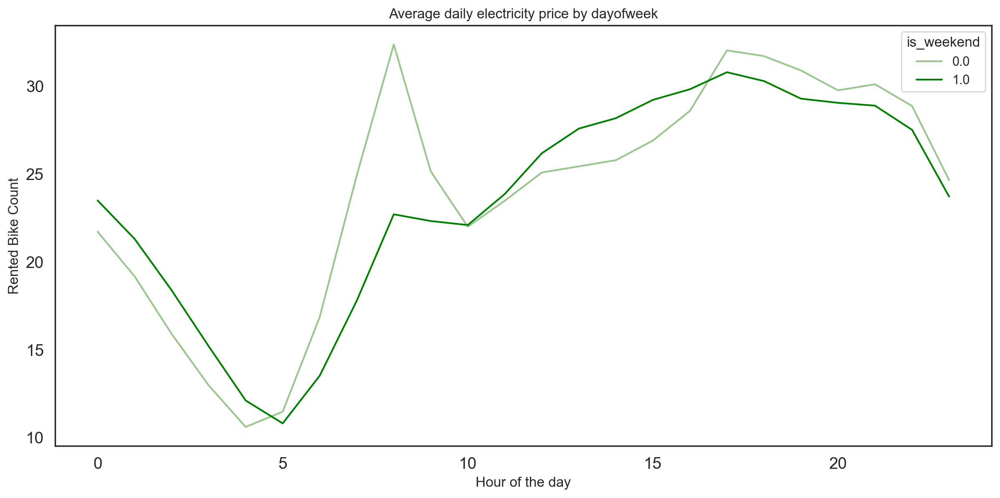

In [52]:
plt.figure(figsize=(12,6))

df_pivot = pd.pivot_table(df, index=df.Hour, columns=df.is_weekend, values='RBC')

ax = df_pivot.plot(title='Data by Year', figsize=(12, 6), color=['#99C68E', '#008000'])
ax.set_ylabel('Rented Bike Count', fontsize=12)
ax.set_xlabel('Hour of the day', fontsize=12)

ax.set_title('Average daily electricity price by dayofweek', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=14)

ax.figure.tight_layout()
plt.savefig('./img/weekend_demand.jpg', dpi=300)

plt.show()

RBC                                             
             count        sum   mean  min     max median    std
is_weekend                                                     
0           6024.0  4462544.0  740.8  2.0  3556.0  558.0  652.1
1           2441.0  1709770.0  700.4  2.0  3256.0  504.0  616.7

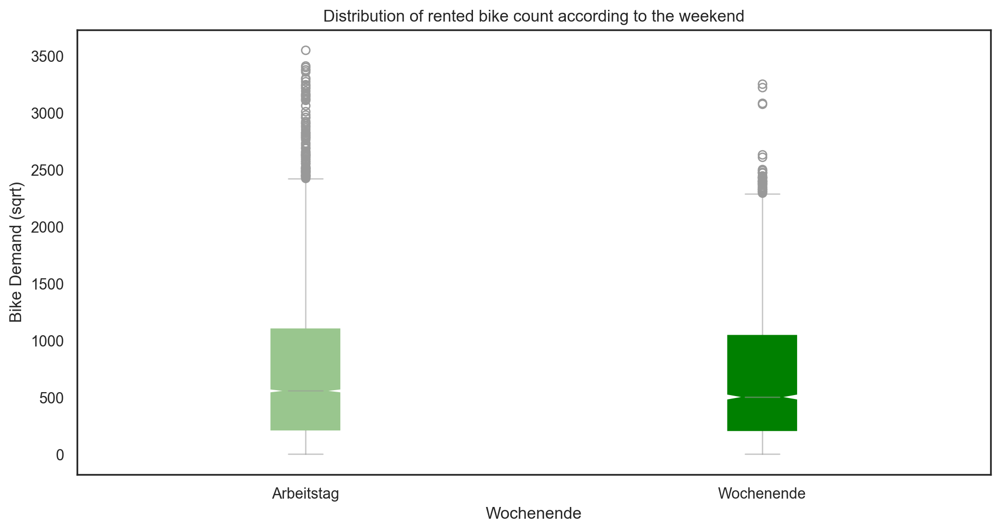

In [109]:
plt.figure(figsize=(12,6))

# group by holiday to get box plot
groups = df.groupby(by=['is_weekend'], sort=False).RBC
labels = ['Arbeitstag', 'Wochenende']
groups = [groups.get_group(k) for k in groups.groups]

# custom colors
gray_dict = dict(color='#99999988', markeredgecolor='#999999')
colors = ['#A7F4CF', '#23e589']
boxplot = plt.boxplot(
    groups, notch=True, vert=True, patch_artist=True, labels=labels,
    capprops=gray_dict, whiskerprops=gray_dict, flierprops=gray_dict, medianprops=gray_dict
)
# change box colors
for i, patch in enumerate(boxplot['boxes']):
    patch.set_color(colors[i%len(colors)])

plt.title('Distribution of rented bike count according to the weekend')
plt.xlabel('Wochenende')
plt.ylabel('Bike Demand (sqrt)')
plt.savefig('./img/weekend_workingday.jpg', dpi=300)

# display multiple aggregates and remove the temporary columns
df.groupby('is_weekend', sort=False).agg({'RBC': ['count', 'sum', 'mean', 'min', 'max', 'median', 'std']}).apply(lambda row: [f'{x:.1f}' for x in row])


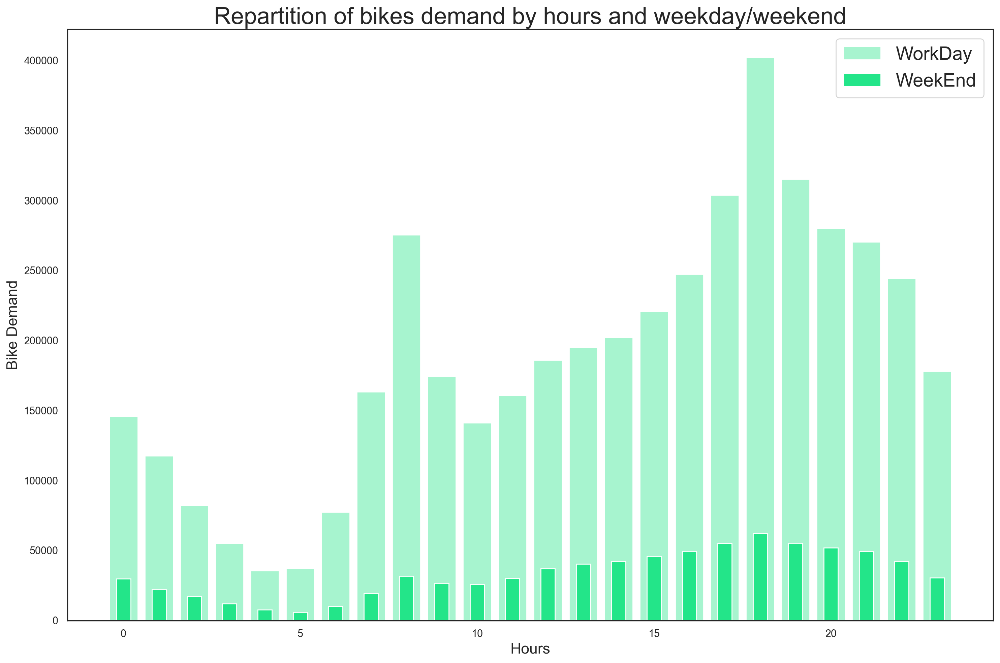

In [166]:
BikeHoursWorkDay={}
for k in range(24):
    BikeHoursWorkDay[k] = df[(df["Hour"] == k) & df["weekday"].between(1, 5)].sum()["RBC"]

BikeHoursWeekEnd={}
for k in range(24):
    BikeHoursWeekEnd[k] = df[(df["Hour"] == k) & df["weekday"].between(6, 7)].sum()["RBC"]
    
fig, ax = plt.subplots()
p1 = ax.bar(BikeHoursWorkDay.keys(), BikeHoursWorkDay.values(), color='#A7F4CF', label ="WorkDay")
p2 = ax.bar(BikeHoursWeekEnd.keys(), BikeHoursWeekEnd.values(), color='#23e589', label ="WeekEnd", width= 0.4)
plt.gcf().set_size_inches(15,10)
plt.title("Repartition of bikes demand by hours and weekday/weekend", fontsize = 25)
plt.xlabel('Hours', fontsize = 16)
plt.ylabel('Bike Demand', fontsize = 16)
fig.tight_layout()
ax.legend(fontsize=20)
plt.savefig('./img/weekday_workingday_inOne.jpg', dpi=300)

plt.show()

In [148]:
# Sum of bikes rented sorted by season
df.groupby('is_weekend')['RBC'].sum()

is_weekend
0    4462544
1    1709770
Name: RBC, dtype: int64

In [151]:
(4462544/df.RBC.sum())*100

72.29936778977869

In [152]:
(1709770/df.RBC.sum())*100

27.700632210221322

# Hour

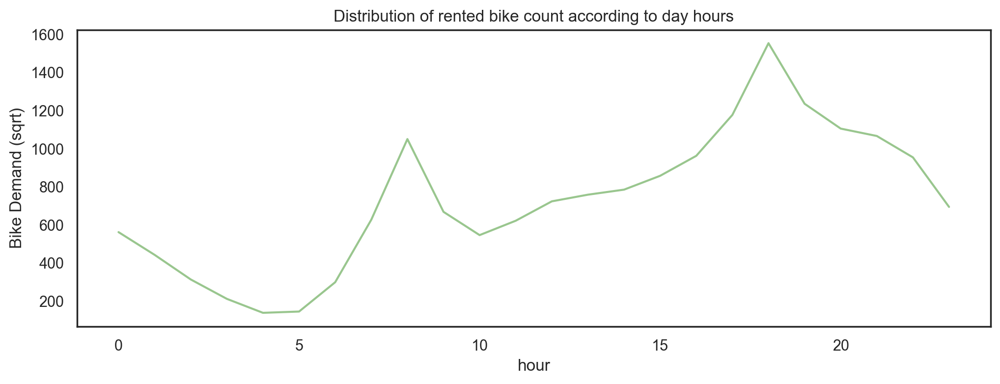

In [145]:
_temp = df.groupby('Hour').agg({'RBC': ['mean', 'std']}).reset_index()
mean = _temp.RBC['mean']
std = _temp.RBC['std']
plt.plot(_temp.Hour, mean, color='#99C68E', label='mean') 
#plt.fill_between(_temp.Hour, mean - std, mean + std, color='#008000', alpha=0.1, label='1-std interval') 
#plt.legend()
plt.title('Distribution of rented bike count according to day hours')
plt.xlabel('hour')
plt.ylabel('Bike Demand (sqrt)')

plt.savefig('./img/Hour_demand.jpg', dpi=300)
pass

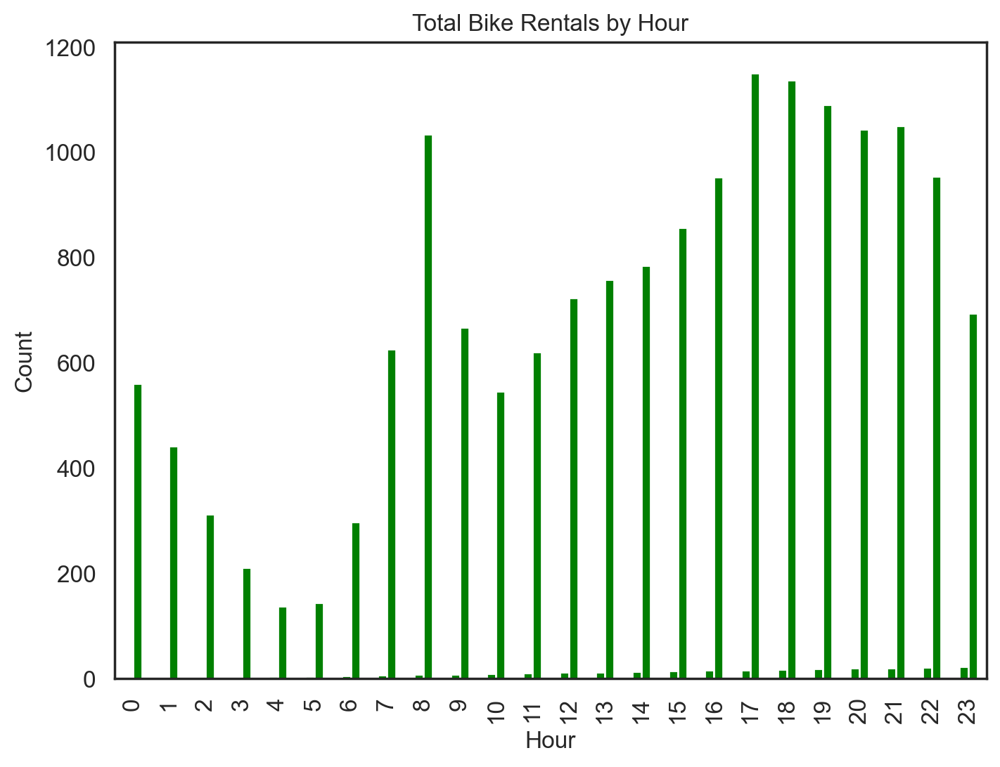

In [58]:
ax = df_index[['Hour','RBC']].groupby(['Hour']).mean().reset_index().plot(kind='bar', figsize=(8, 6),
                                       legend = False, title ="Total Bike Rentals by Hour", 
                                       color='#008000', fontsize=12)
ax.set_xlabel("Hour", fontsize=12)
ax.set_ylabel("Count", fontsize=12)
plt.savefig('./img/Hour_hist.jpg', dpi=300)

plt.show()

Daily patterns

There must be some daily patterns in the prices, cause the consumption- I am guessing- has similar patterns everyday especially on a regular workday. This obviously changes when it is a weekend, or a holiday, so let's see what the data has to say about daily patterns.

First up, let us look at an aggregrated data of prices grouped by time of day. We want to see mean usage over the day, and how much this varies across different dates. A box plot is well suited for this.

# TEMP

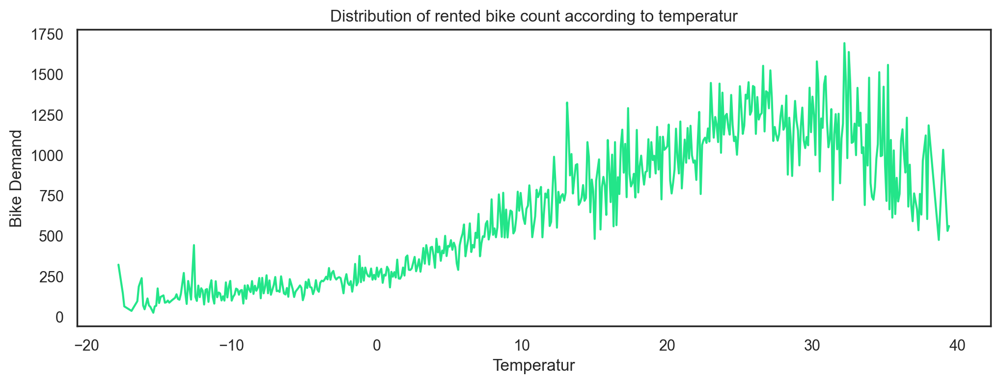

In [167]:
_temp = df.groupby('Temp').agg({'RBC': ['mean', 'std']}).reset_index()
mean = _temp.RBC['mean']
std = _temp.RBC['std']
plt.plot(_temp.Temp, mean, color='#23E589', label='mean') 
#plt.fill_between(_temp.Temp, mean - std, mean + std, color='#008000', alpha=0.1, label='1-std interval') 
#plt.legend()
plt.title('Distribution of rented bike count according to temperatur')
plt.xlabel('Temperatur')
plt.ylabel('Bike Demand')

plt.savefig('./img/Temp_demand.jpg', dpi=300)
pass

# Seasons

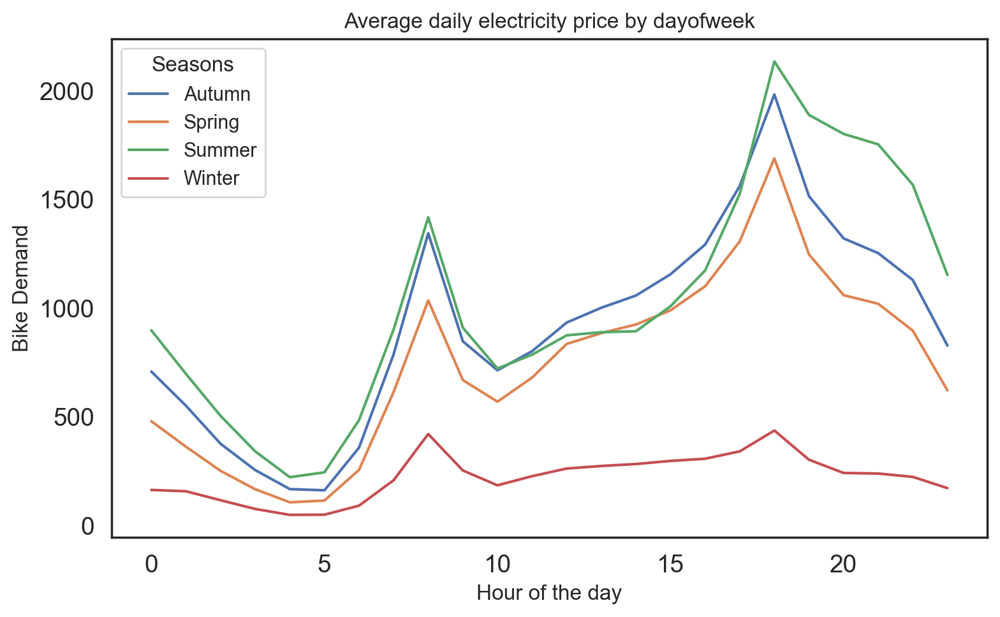

In [169]:
sns.set_style('white')

df_pivot = pd.pivot_table(df, index=df.Hour, columns=df.Seasons, values='RBC')

ax = df_pivot.plot(title='Data by Year', figsize=(8,5))
ax.set_ylabel('Bike Demand', fontsize=12)
ax.set_xlabel('Hour of the day', fontsize=12)

ax.set_title('Average daily electricity price by dayofweek', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=14)

ax.figure.tight_layout()
plt.savefig('./img/Seasons_demand.jpg', dpi=300)

plt.show()

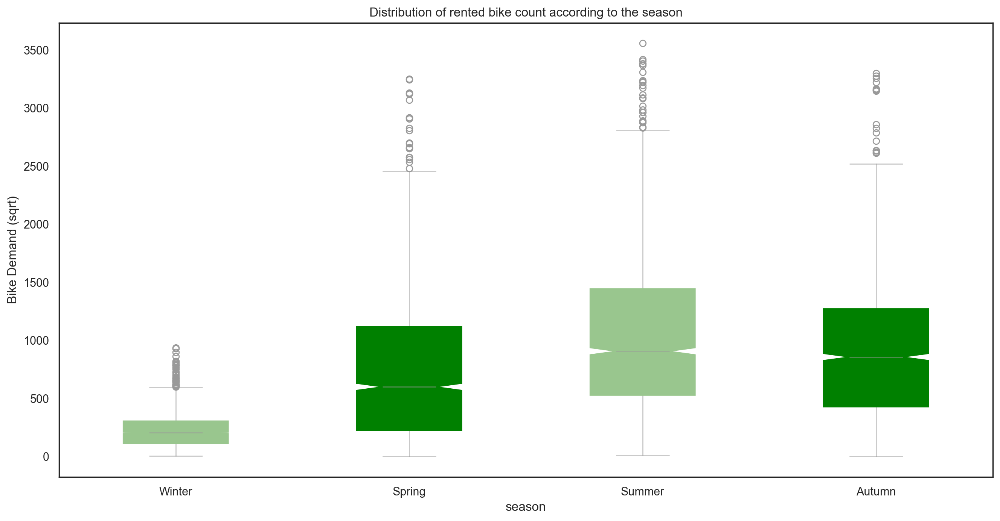

In [112]:
plt.figure(figsize=(16,8))

# group by season to get box plot
groups = df.groupby(by=['Seasons'], sort=False).RBC
labels = groups.count().reset_index(name='RBC').Seasons.values
groups = [groups.get_group(k) for k in groups.groups]

# custom colors
gray_dict = dict(color='#99999988', markeredgecolor='#999999')
colors = ['#A7F4CF', '#23e589']
boxplot = plt.boxplot(
    groups, notch=True, vert=True, patch_artist=True, labels=labels,
    capprops=gray_dict, whiskerprops=gray_dict, flierprops=gray_dict, medianprops=gray_dict
)
# change box colors
for i, patch in enumerate(boxplot['boxes']):
    patch.set_color(colors[i%len(colors)])

plt.title('Distribution of rented bike count according to the season')
plt.xlabel('season')
plt.ylabel('Bike Demand (sqrt)')

plt.savefig('./img/Seasons_distribution.jpg', dpi=300)

# display multiple aggregates and remove the temporary columns
#df.groupby('Seasons', sort=False).agg({'RBC': ['count', 'sum', 'mean', 'min', 'max', 'median', 'std']}).apply(lambda row: [f'{x:.1f}' for x in row])

In [113]:
#########################
## Business Question 2 ##
#########################
#Is there a season when bikes are rented more than others?

# Mean of bikes rented sorted by Season  
df.groupby('Seasons')['RBC'].mean()

Seasons
Autumn     924.110480
Spring     746.254167
Summer    1034.073370
Winter     225.541204
Name: RBC, dtype: float64

In [114]:
# Sum of bikes rented sorted by season
df.groupby('Seasons')['RBC'].sum()

Seasons
Autumn    1790002
Spring    1611909
Summer    2283234
Winter     487169
Name: RBC, dtype: int64

In [140]:
print("aut", (1790002/df.RBC.sum()*100).round(2))
print("sp", (1611909/df.RBC.sum()*100).round(2))
print("su", (2283234/df.RBC.sum()*100).round(2))
print("wi", (487169/df.RBC.sum()*100).round(2))

aut 29.0
sp 26.12
su 36.99
wi 7.89


In [141]:
df.RBC.sum()

6172314

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



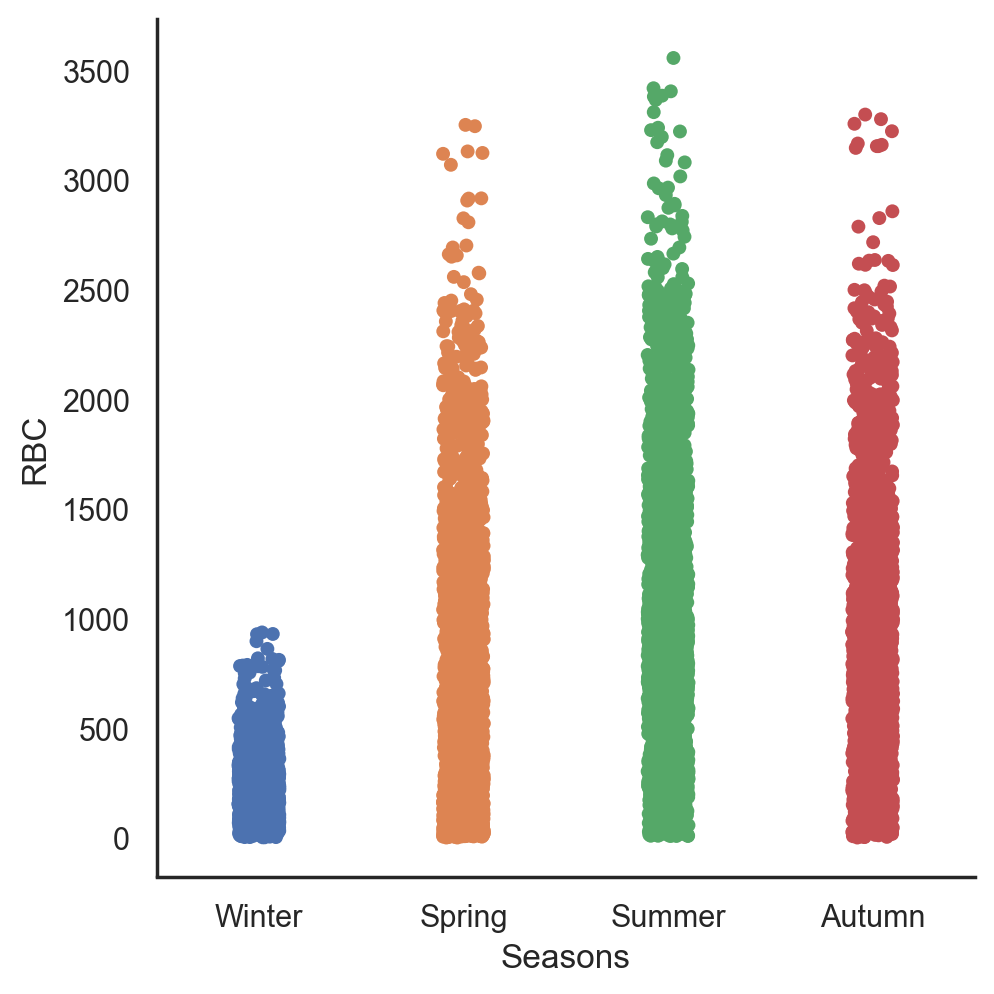

In [115]:
# Sum of bikes rented sorted by day 
sns.catplot('Seasons','RBC', data=df)
## Most bikes are rented in Summer and least in Winter 

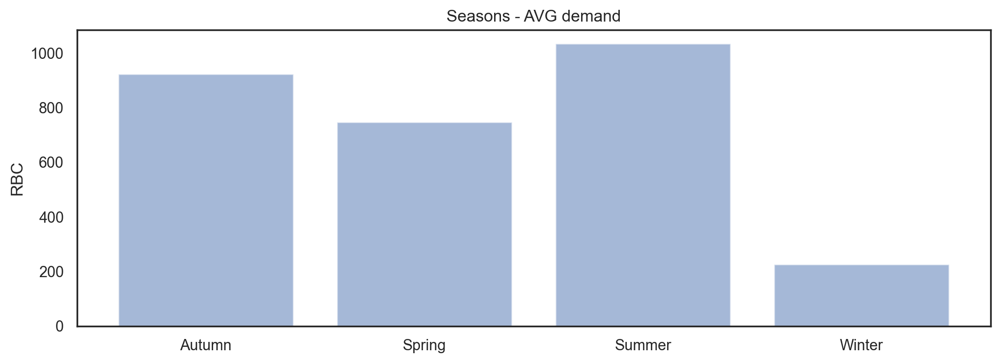

In [116]:
df_seasons = df.groupby('Seasons').mean()['RBC']
df_seasons

objects = df_seasons.index
y_pos = np.arange(len(objects))
performance = df_seasons.values

plt.bar(y_pos, performance, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('RBC')
plt.title('Seasons - AVG demand')

plt.show()

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



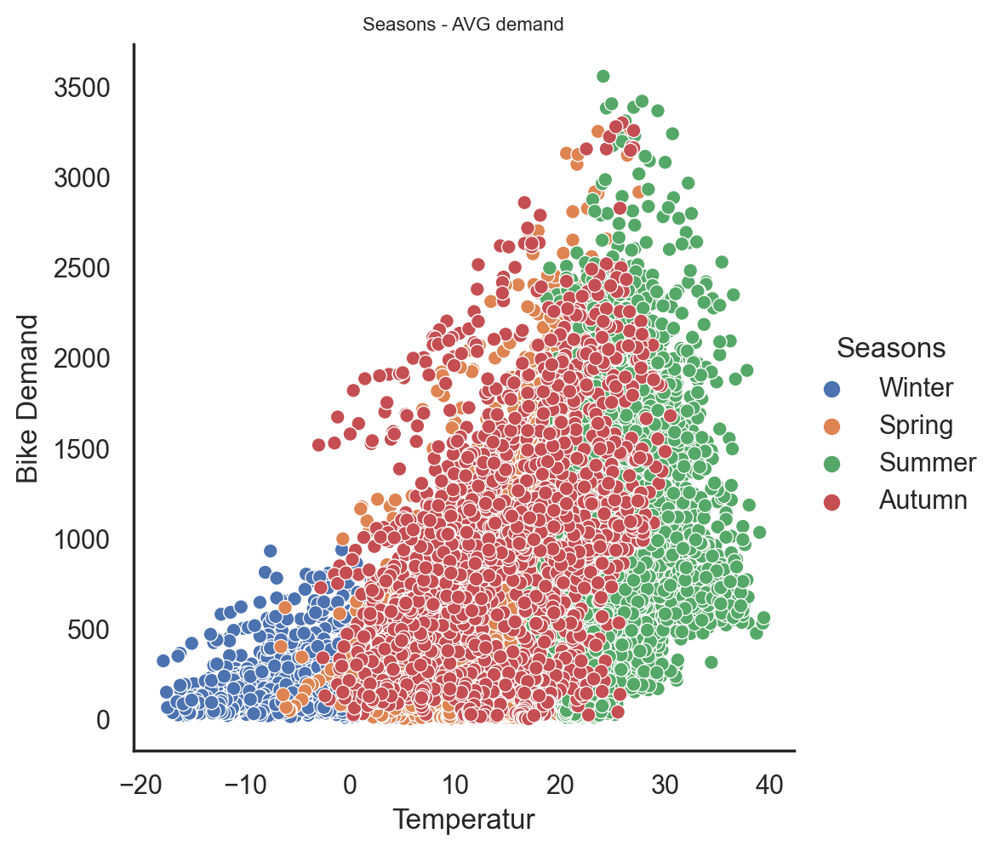

In [177]:
sns.relplot('Temp','RBC', hue='Seasons', data=df)
plt.ylabel('Bike Demand')
plt.xlabel('Temperatur')

plt.title('Seasons - AVG demand',fontsize=8)
plt.savefig('./img/Seasons_sns.jpg', dpi=100)


# Holiday

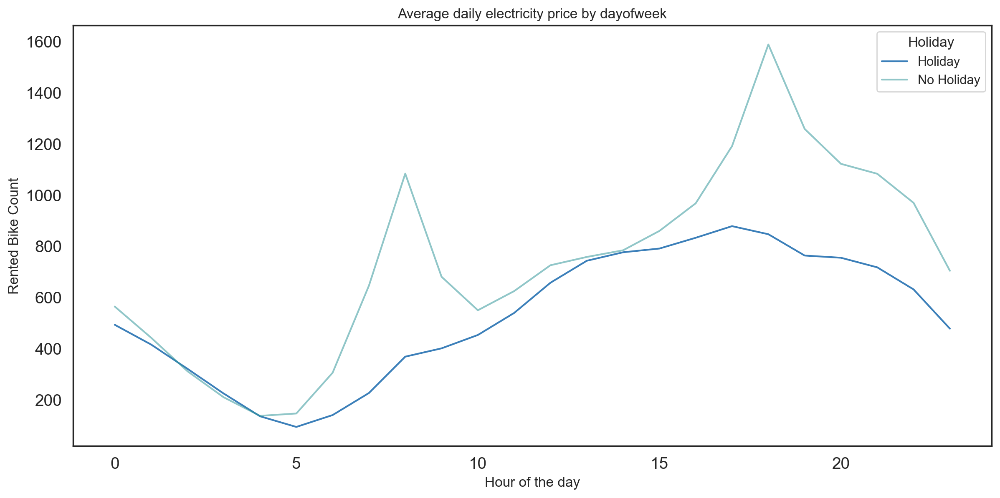

In [142]:
sns.set_style('white')

df_pivot = pd.pivot_table(df, index=df.Hour, columns=df.Holiday, values='RBC')

ax = df_pivot.plot(title='Data by Year', figsize=(12, 6), color=['#3b7fb9', '#2f959988'])
ax.set_ylabel('Rented Bike Count', fontsize=12)
ax.set_xlabel('Hour of the day', fontsize=12)

ax.set_title('Average daily electricity price by dayofweek', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=14)

ax.figure.tight_layout()
plt.savefig('./img/Holiday_demand.jpg', dpi=300)

plt.show()

RBC                                             
             count        sum   mean  min     max median    std
Holiday                                                        
No Holiday  8057.0  5956419.0  739.3  2.0  3556.0  561.0  644.0
Holiday      408.0   215895.0  529.2  3.0  2400.0  259.0  573.9

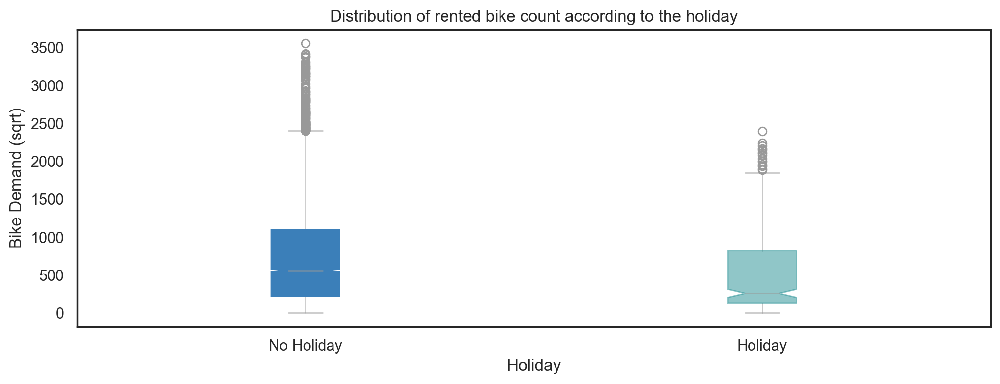

In [143]:
# group by holiday to get box plot
groups = df.groupby(by=['Holiday'], sort=False).RBC
labels = ['No Holiday', 'Holiday']
groups = [groups.get_group(k) for k in groups.groups]

# custom colors
gray_dict = dict(color='#99999988', markeredgecolor='#999999')
colors = ['#A7F4CF', '#23e589']
boxplot = plt.boxplot(
    groups, notch=True, vert=True, patch_artist=True, labels=labels,
    capprops=gray_dict, whiskerprops=gray_dict, flierprops=gray_dict, medianprops=gray_dict
)
# change box colors
for i, patch in enumerate(boxplot['boxes']):
    patch.set_color(colors[i%len(colors)])

plt.title('Distribution of rented bike count according to the holiday')
plt.xlabel('Holiday')
plt.ylabel('Bike Demand (sqrt)')
# display multiple aggregates and remove the temporary columns

plt.savefig('./img/Holiday_distribution.jpg', dpi=300)


df.groupby('Holiday', sort=False).agg({'RBC': ['count', 'sum', 'mean', 'min', 'max', 'median', 'std']}).apply(lambda row: [f'{x:.1f}' for x in row])

It is not as clear as for the seasons or the months but there is a trend for less bike rented during holidays. We almost can conclude these bikes are rented to go to work.



Season
In the season column, we are able to understand that the demand is low in the winter season.

Holiday
In the Holiday column, The demand is low during holidays, but in no holidays the demand is high, it may be because people use bikes to go to their work/school.

Functioning Day
In the Functioning Day column, If there is no Functioning Day then there is no demand

Days of week
In the Days of week column, We can observe from this column that the pattern of weekdays and weekends is different, in the weekend the demand becomes high in the afternoon. While the demand for office timings is high during weekdays, we can further change this column to weekdays and weekends.

month
In the month column, We can clearly see that the demand is low in December January & Febuary, It is cold in these months and we have already seen in season column that demand is less in winters.

year
The demand was less in 2017 and higher in 2018, it may be because it was new in 2017 and people did not know much about it.

It is quiet obvious that people tend to rent bike during summer season since it is really conducive to ride bike at that season.Therefore June, July and August has got relatively higher demand for bicycle.
On weekdays more people tend to rent bicycle around 7AM-8AM and 5PM-6PM. As we mentioned earlier this can be attributed to regular school and office commuters.
Above pattern is not observed on "Saturday" and "Sunday".More people tend to rent bicycle between 10AM and 4PM.

In [ ]:
rental_count = df.sort_values('RBC', ascending=False)
print("Which day had the highest rented bikes")
print(rental_count.iloc[0])

In [ ]:
df

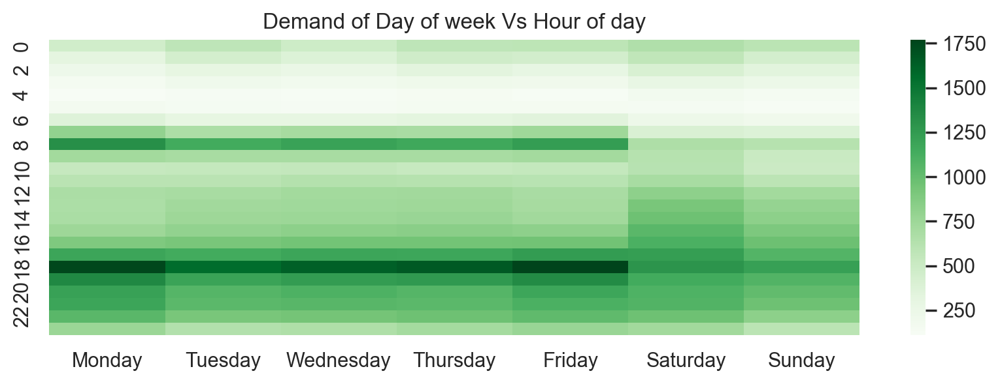

In [168]:
grouped_df = df.groupby(["Hour", "weekday_name"])["RBC"].aggregate("mean").reset_index()
grouped_df = grouped_df.pivot('Hour', 'weekday_name', 'RBC')
grouped_df = grouped_df[['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']]

plt.figure(figsize=(10,3))

sns.heatmap(grouped_df, cmap="Greens")
plt.xlabel('')
plt.ylabel('')
plt.title("Demand of Day of week Vs Hour of day")
plt.savefig('./img/Demand_Hour_matrix.jpg', dpi=300)

plt.show()

# FUTURE WORK: Only suspect if you fill the missing values (dates)

# Decomposition and stationarity tests

Stationarity
Before we move forward we need to discuss an important property of the time series data which is Stationarity.

If a process is stationary, that means it does not change its statistical properties over time, namely its mean and variance. (The latter is called homoscedasticity). The covariance function does not depend on time; it should only depend on the distance between observations.
Why is stationarity so important? Because it is easy to make predictions on a stationary series since we can assume that the future statistical properties will not be different from those currently observed. Most of the time-series models, in one way or the other, try to predict those properties (mean or variance, for example). Future predictions would be wrong if the original series were not stationary.
From the above definition of stationarity it is clear that our energy consumption dataset is not stationary because it has a trend (changing mean) and also seasonality which means that the covariance function does depend on time. The simplest way to identify stationarity (or its absence) is viewing the data as we did above by decomposing it but the most common way of testing a dataset for stationarity is the Dicky Fuller test which tests for a unit root. Basically, if the p-value of the test is too small (say less than 0.05, giving us 95% confidence) then we reject the hypothesis that our data is non-stationary and assume that it is stationary indeed.

And the most common way of dealing with stationarity is differencing our dataset. Let's see some examples below.

For our time series models we need to consider stationarity and autocorrelation. From our previous eda we expect to see non-stationarity and a fair amount of autocorrelation as our data is definitely seasonal. 

In [ ]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss, ccf

In [ ]:
df['Date_new'] = pd.to_datetime(df['Date_new'])

In [ ]:
df.index = pd.to_datetime(df.index)

In [ ]:
# Decompose the electricity price time series

res = sm.tsa.seasonal_decompose(df['RBC'], model='additive')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 12))
res.observed.plot(ax=ax1, title='Observed')
res.trend.plot(ax=ax2, title='Trend')
res.resid.plot(ax=ax3, title='Residual')
res.seasonal.plot(ax=ax4, title='Seasonal')
plt.tight_layout()
plt.show()

Hourly Trends

In [ ]:
decomp = seasonal_decompose(df['RBC'])

# Plot the decomposed time series.
decomp.plot()
plt.title('Seasonal Decomposition of Total Load (hourly)');

If we look at all of the data we don't see many clear trends, let's try grouping by day, week, month and look for trends.

Daily Trend

In [ ]:
# Decompose time series into trend, seasonal, and residual components.
decomp = seasonal_decompose(df['RBC'].resample('D').sum())

# Plot the decomposed time series.
decomp.plot()
plt.title('Seasonal Decomposition of Total Load (daily)');

Monthly Trend

In [ ]:
# Decompose time series into trend, seasonal, and residual components.
decomp = seasonal_decompose(df['€/mwh'].resample('M').sum())

# Plot the decomposed time series.
decomp.plot()
plt.title('Seasonal Decomposition of Total Load (monthly)');

When we get to monthly resampling we can see some clear seasonality appears with the summer months and around the turn of the year showing the highests levels of total_load. Additionally we see an overall trend of increasing load over time.

# The Augmented Dickey-Fuller (ADF)

The Augmented Dickey-Fuller (ADF) test, a type of unit root test, determines how strongly a time series is defined by a trend. Its hypotheses are the following:

Null Hypothesis  𝐻0 : There is a unit root in the time series, i.e. the series is autocorrelated with (r=1), a time dependent structure and thus, is not stationary.

Alternate Hypothesis  𝐻1 : The time series has no unit root and is either stationary or can be made stationary using differencing.

In [ ]:
y = df_no_outlier['RBC']
adf_test = adfuller(y, autolag='AIC')
print('ADF Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(adf_test[0], adf_test[1], adf_test[2]))
for key, value in adf_test[4].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

In [ ]:
rmean1=y.rolling(window=12).mean()
rstd1=y.rolling(window=12).std()

orig=plt.plot(y , color='black',label='Original')
mean= plt.plot(rmean1 , color='red',label='Rolling Mean')
std=plt.plot(rstd1,color='blue',label = 'Rolling Standard Deviation')
plt.legend(loc='best')
plt.title("Rolling mean and standard deviation")
plt.show(block=False)

Though the variation in standard deviation is small, mean is clearly increasing with time and this is not a stationary series. Also, the test statistic is way more than the critical values.

The ADF statistic (-15.833732) is less than the critical value at 1% (-3.431) and thus, we can say that we reject the null hypothesis  𝐻0  with a significance level 1%, meaning that there is not a root-unit in the time series and thus, that it is either stationary or could be made stationary with 1st order differencing (difference-stationary).

We can reject the null hypothesis that price is not stationary, this is good news for our modeling.


### Kwiatkowski-Phillips-Schmidt-Shin (KPSS)

The Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test, follows the opposite logic from Augmented Dickey-Fuller test and checks for stationarity. Its hypotheses are the following:

Null Hypothesis  𝐻0 : The time series is level, i.e. it is stationary around a constant.

Alternate Hypothesis  𝐻1 : There is a unit root in the time series and thus it not stationary.

In [ ]:
kpss_test = kpss(y, regression='c', lags='legacy')
print('KPSS Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(kpss_test[0], kpss_test[1], kpss_test[2]))
for key, value in kpss_test[3].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

The KPSS statistic (4.522832) is higher than the critical value at 1% (0.739) and thus, we can say that we cannot reject the null hypothesis  𝐻0  with a significance level 1%, meaning that the time series is stationary or stationary around a constant.

Both tests concluded that the electricity price time series is stationary, while it is also true that deep neural networks can handle such properties in a more forgiving way compared to ARIMA models.

#  Autocorrelation, partial autocorrelation and cross-correlation

Correlation with the past values
The correlation of the time series observations calculated with values of the same series at previous times, is called a serial correlation, or an autocorrelation (ACF). It is used to determine the moving average (MA or q) term of the ARIMA(p,d,q) models.

A partial autocorrelation (PACF) is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed. It is used to determine the auto regression (AR or p) term of the ARIMA(p,d,q) models.

And we have observed till now that our energy consumption time series has a strong correlation with its past day value (lag of 24 hours) and also its past value 365*24 hours ago. In addition a weekly seasonality is also observed in the energy consumption. Let's plot the ACF and PACF plots for our energy time series data.

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [ ]:
# Plot autocorrelation and partial autocorrelation plots

fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(8, 6))
plot_acf(df['€/mwh'], lags=24*7, ax=ax1)
plot_pacf(df['€/mwh'], lags=48, ax=ax2)
plt.tight_layout()
plt.show()

The partial autocorrelation plot of the eletricity price time series shows that the direct relationship between an observation at a given hour (t) is strongest with the observations at t-1, t-2, t-24 and t-25 time-steps and diminishes afterwards. Thus, we are going to use the 25 previous values of each time series which will constitute a feature for our models.

In [ ]:
plot_acf(df['€/mwh'], lags = 24, title='Autocorrelation of Price with past 24 hours');

We can see that the hours immediately preceding the hour in question and as we approach the previous day show the highest autocorrelation, this is in line with what we would expect given our EDA showing that prices fluctuate significantly thoughout the day.

In [ ]:
plot_pacf(df['€/mwh'], lags = 24, title='Partial Autocorrelation of Price with past 24 hours');


Showing the partial autocorrelation it seems as though all of the previous hours have some significance, though 1, 2 and 24 hours in the past show the most significance.

In [ ]:
# Autocorrelation - look at one week
plot_acf(df['€/mwh'], lags = 24*7, title='Autocorrelation of Price with past Week');